# Landsat 7 - Gray Glacier

In [1]:
from dask.distributed import Client, LocalCluster
cluster = LocalCluster()
client = Client(cluster)

In [2]:
import datacube
import xarray as xr
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from odc.ui import DcViewer
from datacube.utils import masking
from datacube.utils.rio import configure_s3_access

configure_s3_access(aws_unsigned=False, requester_pays=True, client=client)

In [3]:
dc = datacube.Datacube(app='landsat-glacier') 


In [4]:
dc.list_products()


,name,description,license,default_crs,default_resolution
name,,,,,
asf_s1_grd_gamma0,asf_s1_grd_gamma0,Sentinel 1 Radiometrically Terrain Corrected,CC-BY-4.0,None,None
asf_s1_rtc_grd_hd,asf_s1_rtc_grd_hd,Sentinel 1 Radiometrically Terrain Corrected,CC-BY-4.0,None,None
copernicus_dem_30,copernicus_dem_30,Copernicus 30m Digital Elevation Model (GLO-30),None,None,None
copernicus_dem_90,copernicus_dem_90,Copernicus 90m Digital Elevation Model (GLO-90),None,None,None
cr2met,cr2met,"CR2MET, a high-resolution precipitation and te...",None,None,None
fasat_charlie_ms,fasat_charlie_ms,FASat Charlie TOA multi-spectral data (Sistema...,None,None,None
landcover_chile_2014,landcover_chile_2014,Land Cover de Chile 2014,None,None,None
landsat5_c2l2_sr,landsat5_c2l2_sr,Landsat 5 Collection 2 Level-2 Surface Reflect...,None,None,None
landsat5_c2l2_st,landsat5_c2l2_st,Landsat 5 Collection 2 Level-2 UTM Surface Tem...,CC-BY-4.0,None,None


In [5]:
products = ['landsat7_c2l2_sr', 'landsat7_c2l2_st', 'landsat7_geomedian_annual', 'landsat8_c2l2_sr', 'landsat9_c2l2_sr']
dc.list_measurements().loc[products]

name    dtype         units  \
product                   measurement                                           
landsat7_c2l2_sr          blue                    blue   uint16   reflectance   
                          green                  green   uint16   reflectance   
                          red                      red   uint16   reflectance   
                          nir08                  nir08   uint16   reflectance   
                          swir16                swir16   uint16   reflectance   
                          swir22                swir22   uint16   reflectance   
                          atmos_opacity  atmos_opacity    int16             1   
                          qa_pixel            qa_pixel   uint16     bit_index   
                          qa_radsat          qa_radsat   uint16     bit_index   
                          cloud_qa            cloud_qa    uint8     bit_index   
landsat7_c2l2_st          lwir                    lwir   uint16        Kelvin   
                          TRAD                    TRAD    int16  W/(m2.sr.μm)   
                          URAD                    URAD    int16  W/(m2.sr.μm)   
                          DRAD                    DRAD    int16  W/(m2.sr.μm)   
                          ATRAN                  ATRAN    int16             1   
                          EMIS                    EMIS    int16             1   
                          EMSD                    EMSD    int16             1   
                          CDIST                  CDIST    int16    Kilometers   
                          qa_pixel            qa_pixel   uint16     bit_index   
                          qa_radsat          qa_radsat   uint16     bit_index   
                          qa                        qa    int16        Kelvin   
landsat7_geomedian_annual blue                    blue   uint16             1   
                          green                  green   uint16             1   
                          red                      red   uint16             1   
                          nir08                  nir08   uint16             1   
                          swir16                swir16   uint16             1   
                          swir22                swir22   uint16             1   
                          bcmad                  bcmad  float32             1   
                          smad                    smad  float32             1   
                          emad                    emad  float32             1   
                          count                  count   uint16             1   
landsat8_c2l2_sr          coastal              coastal   uint16   reflectance   
                          blue                    blue   uint16   reflectance   
                          green                  green   uint16   reflectance   
                          red                      red   uint16   reflectance   
                          nir08                  nir08   uint16   reflectance   
                          swir16                swir16   uint16   reflectance   
                          swir22                swir22   uint16   reflectance   
                          qa_pixel            qa_pixel   uint16     bit_index   
                          qa_aerosol        qa_aerosol    uint8     bit_index   
                          qa_radsat          qa_radsat   uint16     bit_index   
landsat9_c2l2_sr          coastal              coastal   uint16   reflectance   
                          blue                    blue   uint16   reflectance   
                          green                  green   uint16   reflectance   
                          red                      red   uint16   reflectance   
                          nir08                  nir08   uint16   reflectance   
                          swir16                swir16   uint16   reflectance   
                          swir22                swir22   uint16   reflectance   


Necesitamos:

Checklist para landsat7_c2l2_sr

- LE7 B1 (blue) (check)
- LE7 B2 (green) (check)
- LE7 B3 (red) (check)
- LE7 B4 (near infrared) (check)
- LE7 B5 (shortwave infrared 1) (check)
- LE7 B6_VCID_1 (low-gain thermal infrared) *(NOT CHECK)*
- LE7 B6_VCID_2 (high-gain thermal infrared)    *(NOT CHECK)*
- LE7 B7 (shortwave infrared 2)  (check)
- LE7 B8 (panchromatic)  *(NOT CHECK)*
- LE7 BQA (quality bitmask) (Como lo us KHK?)
- NDVI (vegetation index) (calculable)
- NDSI (snow index) (calculable)
- NDWI (water index) (calculable)
- SRTM 90 elevation (no)
- SRTM 90 slope (no)

In [6]:
xmin:  -73.35676489704194
ymin:  -51.274579580124886
xmax:  -72.80813635761145
ymax:  -50.839518983207824

In [7]:
query = {
    "product": "landsat7_c2l2_sr",
    "y": (-51.274579580124886, -50.839518983207824), 
    "x": (-73.35676489704194, -72.80813635761145),
    #"time": ("2020-01-01", "2020-12-31"),
    "output_crs": "EPSG:32719",
    "resolution": (-30, 30),
    "dask_chunks": {"time": 1, 'x':2048, 'y':2048},
    "group_by": "solar_day"
}

query8 = {
    "product": "landsat8_c2l2_sr",
    "y": (-51.274579580124886, -50.839518983207824), 
    "x": (-73.35676489704194, -72.80813635761145),
    #"time": ("2020-01-01", "2020-12-31"),
    "output_crs": "EPSG:32719",
    "resolution": (-30, 30),
    "dask_chunks": {"time": 1, 'x':2048, 'y':2048},
    "group_by": "solar_day"
}

In [8]:
ds = dc.load(**query)


In [9]:
from dea_tools.plotting import display_map, rgb


In [10]:
display_map(x = query['x'], y = query['y'])


In [11]:
ds

<xarray.Dataset>
Dimensions:        (time: 719, y: 1684, x: 1371)
Coordinates:
  * time           (time) datetime64[ns] 1999-08-15T14:12:47.400865 ... 2023-...
  * y              (y) float64 4.361e+06 4.361e+06 ... 4.311e+06 4.311e+06
  * x              (x) float64 1.933e+05 1.933e+05 ... 2.344e+05 2.344e+05
    spatial_ref    int32 32719
Data variables:
    blue           (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    green          (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    red            (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    nir08          (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    swir16         (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    swir22         (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    atmos_opacity  (time, y, x) int16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    qa_pixel       (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    qa_radsat      (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    cloud_qa       (time, y, x) uint8 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
Attributes:
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

### Nota: Tenemos 719 tiempos para landsat 7 en total

## Pruebas de mascara de nieve

In [12]:
ds[["qa_pixel"]].isel(time=3).y.to_numpy()

array([4361115., 4361085., 4361055., ..., 4310685., 4310655., 4310625.])

In [13]:
from datacube.utils import masking


In [14]:
masking.describe_variable_flags(ds.qa_pixel)


,bits,values,description
snow,5,"{'0': 'not_high_confidence', '1': 'high_confid...",NaN
clear,6,"{'0': 'not_clear', '1': 'clear'}",NaN
cloud,3,"{'0': 'not_high_confidence', '1': 'high_confid...",NaN
water,7,"{'0': 'land_or_cloud', '1': 'water'}",NaN
nodata,0,"{'0': False, '1': True}",NaN
qa_pixel,"[0, 1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13]","{'1': 'Fill', '2': 'Dilated Cloud', '8': 'Clou...",Level 2 pixel quality
cloud_shadow,4,"{'0': 'not_high_confidence', '1': 'high_confid...",NaN
dilated_cloud,1,"{'0': 'not_dilated', '1': 'dilated'}",NaN
cloud_confidence,"[8, 9]","{'0': 'none', '1': 'low', '2': 'medium', '3': ...",NaN
snow_ice_confidence,"[12, 13]","{'0': 'none', '1': 'low', '2': 'reserved', '3'...",NaN


In [15]:
masking.describe_variable_flags(ds.qa_pixel)["values"]["qa_pixel"]


{'1': 'Fill',
 '2': 'Dilated Cloud',
 '8': 'Cloud',
 '16': 'Cloud Shadow',
 '32': 'Snow',
 '64': 'Clear',
 '128': 'Water',
 '256': 'Cloud Confidence low bit',
 '512': 'Cloud Confidence high bit',
 '1024': 'Cloud Shadow Confidence low bit',
 '2048': 'Cloud Shadow Confidence high bit',
 '4096': 'Snow Ice Confidence low bit',
 '8192': 'Snow Ice Confidence high bit'}

In [16]:
masking.describe_variable_flags(ds.qa_pixel)["values"]["snow_ice_confidence"]


{'0': 'none', '1': 'low', '2': 'reserved', '3': 'high'}

In [17]:
good_pixel_flags = {
    'snow_ice_confidence': 'high'
    #'snow_ice_confidence': 'low'
}

In [18]:
quality_band = 'qa_pixel'
snow_mask1 = masking.make_mask(ds[quality_band], **good_pixel_flags)
dsf = ds[["red", "green", "blue"]].where(snow_mask1)

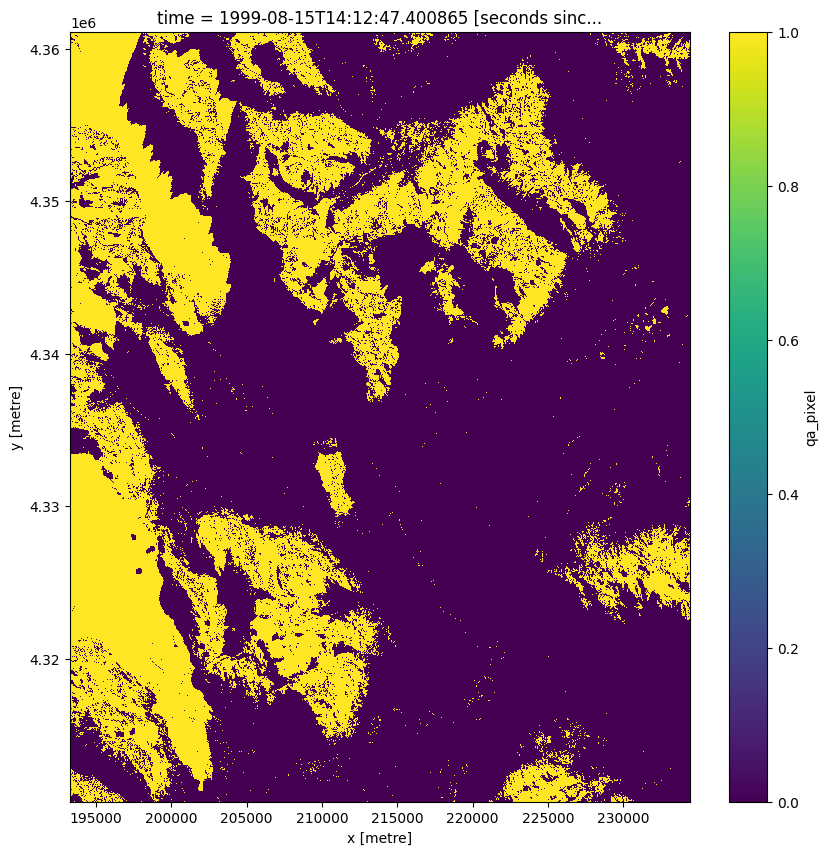

In [19]:
snow_mask1.isel(time=0).plot.imshow(figsize=(10, 10))

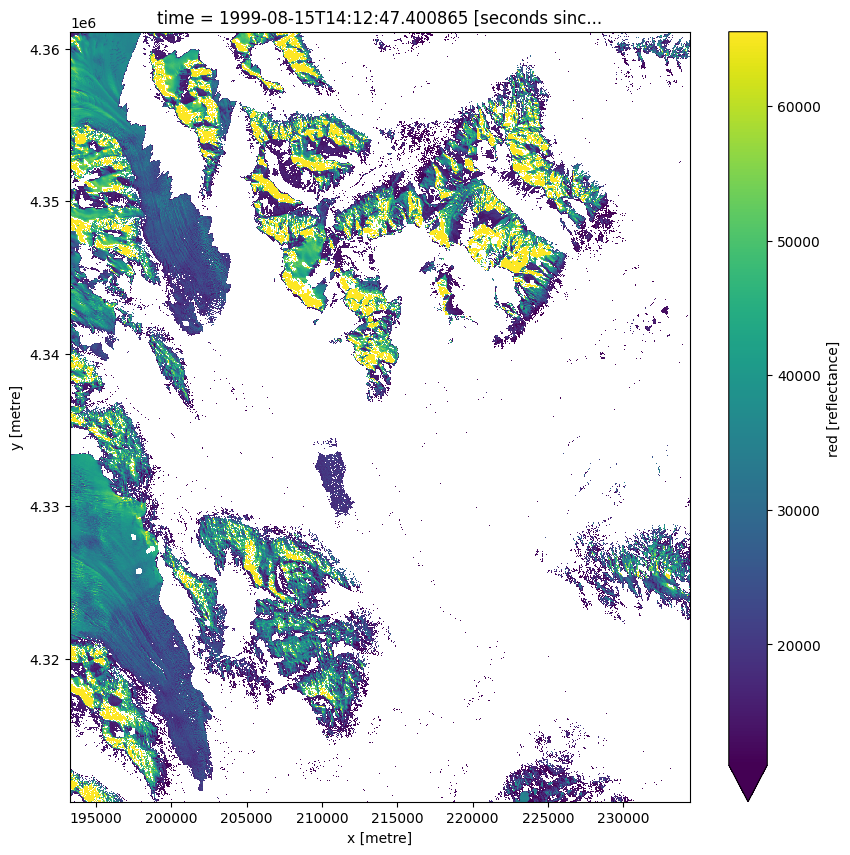

In [20]:
dsf["red"].isel(time=0).plot.imshow(robust=True, figsize=(10, 10))


/env/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(


/env/lib/python3.10/site-packages/matplotlib/cm.py:489: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


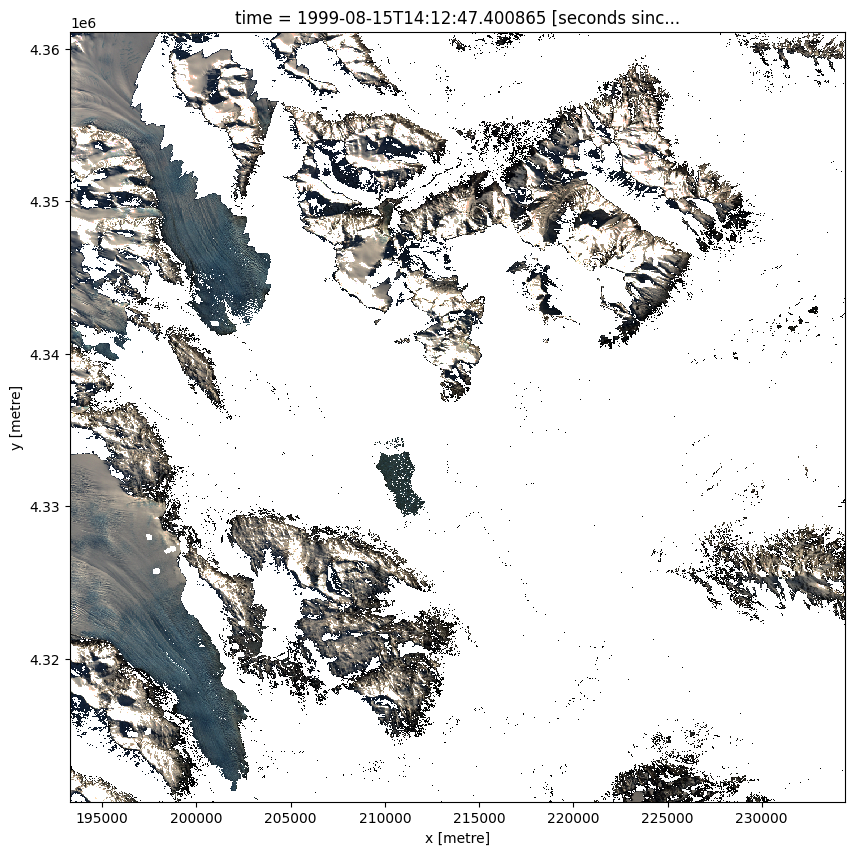

In [21]:
dsf[["red", "green", "blue"]].isel(time=0).to_array().plot.imshow(robust=True, figsize=(10, 10))


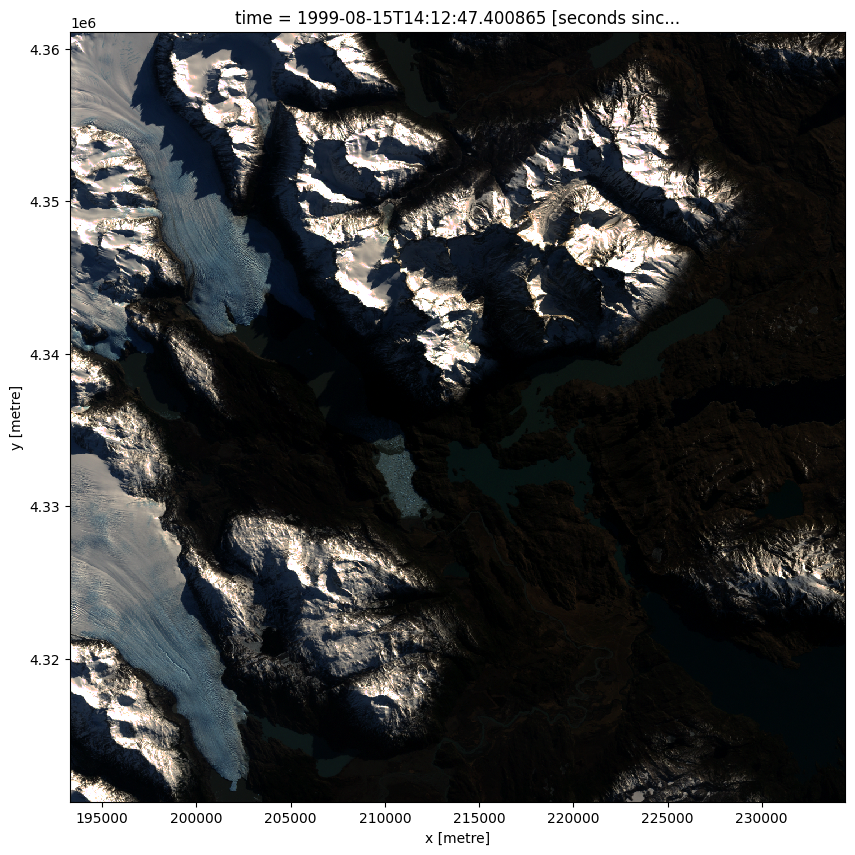

In [22]:
ds[["red", "green", "blue"]].isel(time=0).to_array().plot.imshow(robust=True, figsize=(10, 10))


In [23]:
#snow_mask1.sum(dim=("x", "y"))/(snow_mask1.shape[1] * snow_mask1.shape[2])

In [24]:
'''
# se me ocurre que una medida de calidad de imagen, para filtrar, es el % de snow high en si.

# EDIT: (nah, no tiene mucho sentido, estaria perdiendo los veranos).
valid_pixel_proportion = snow_mask1.sum(dim=("x", "y"))/(snow_mask1.shape[1] * snow_mask1.shape[2])
valid_threshold = 0.2
observations_to_keep = (valid_pixel_proportion >= valid_threshold)
ds_keep = dsf.sel(time=observations_to_keep)
ds_keep[["red", "green", "blue"]].isel(time=40).to_array().plot.imshow(robust=True, figsize=(10, 10))
'''

'\n# se me ocurre que una medida de calidad de imagen, para filtrar, es el % de snow high en si.\n\n# EDIT: (nah, no tiene mucho sentido, estaria perdiendo los veranos).\nvalid_pixel_proportion = snow_mask1.sum(dim=("x", "y"))/(snow_mask1.shape[1] * snow_mask1.shape[2])\nvalid_threshold = 0.2\nobservations_to_keep = (valid_pixel_proportion >= valid_threshold)\nds_keep = dsf.sel(time=observations_to_keep)\nds_keep[["red", "green", "blue"]].isel(time=40).to_array().plot.imshow(robust=True, figsize=(10, 10))\n'

### Casos donde se ve mal

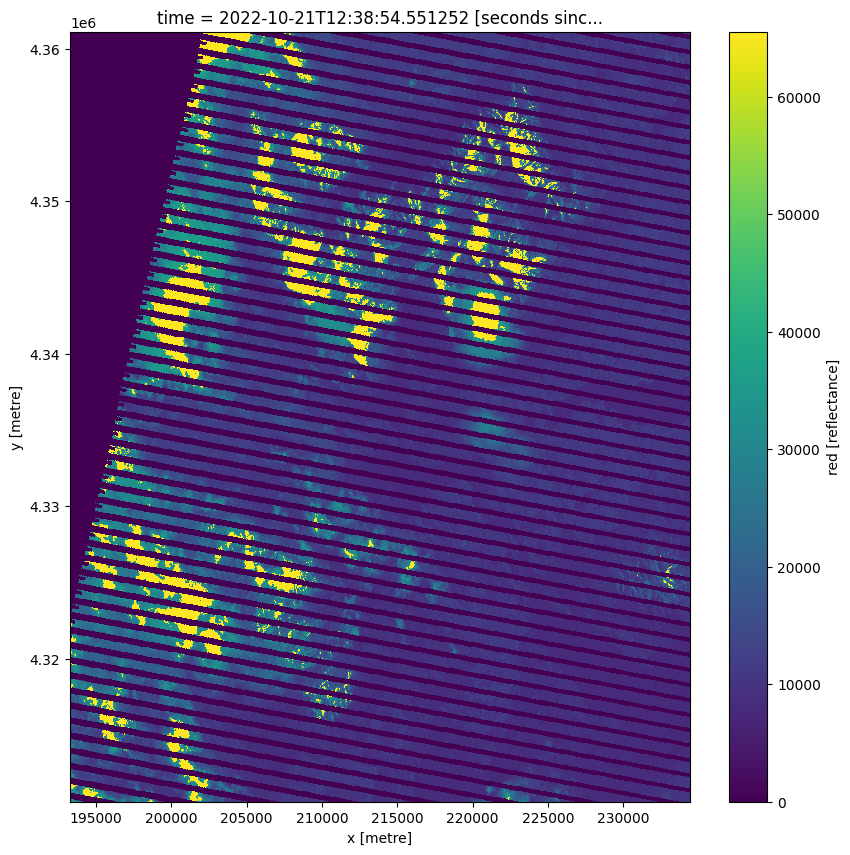

In [25]:
ds["red"].isel(time=700).plot.imshow(robust=True, figsize=(10, 10))


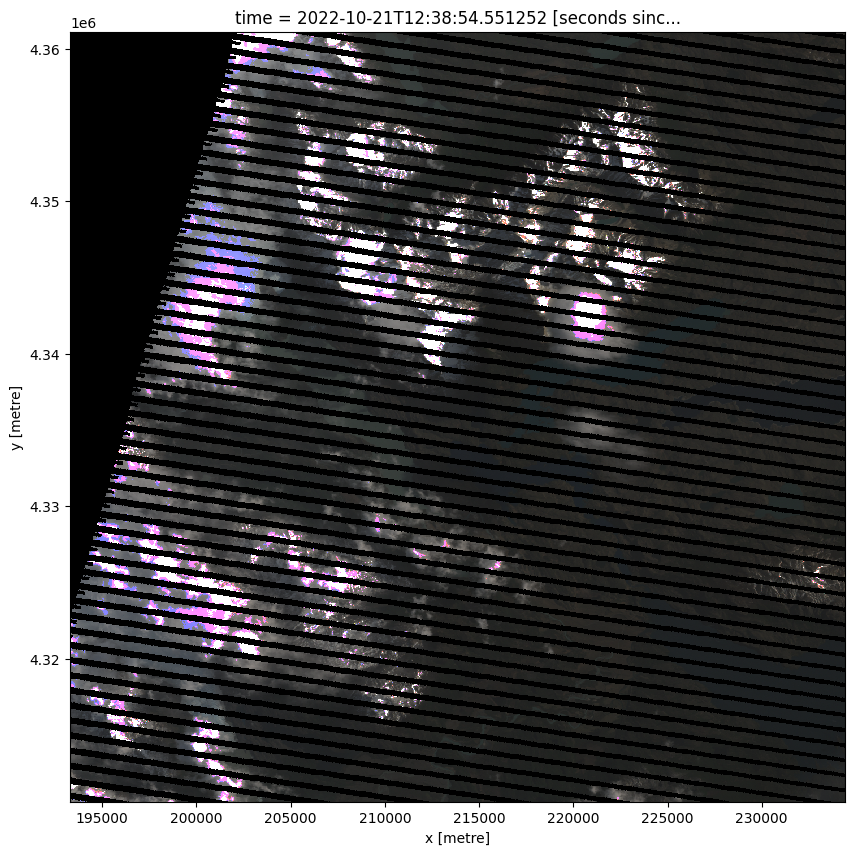

In [26]:
ds[["red", "green", "blue"]].isel(time=700).to_array().plot.imshow(robust=True, figsize=(10, 10))


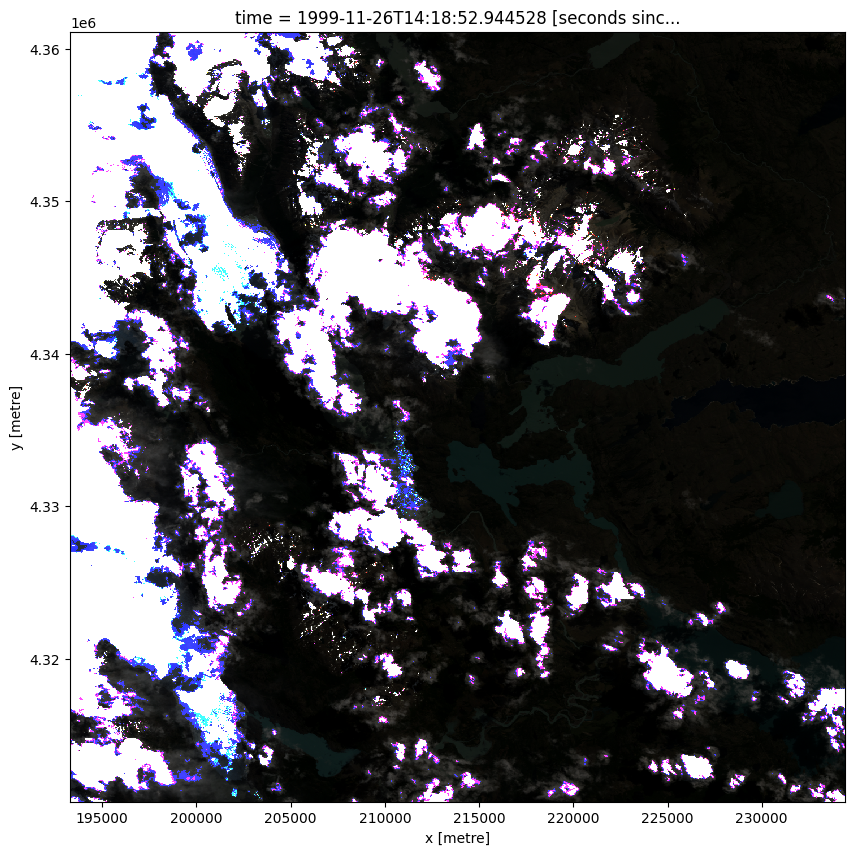

In [27]:
ds[["red", "green", "blue"]].isel(time=10).to_array().plot.imshow(robust=True, figsize=(10, 10))


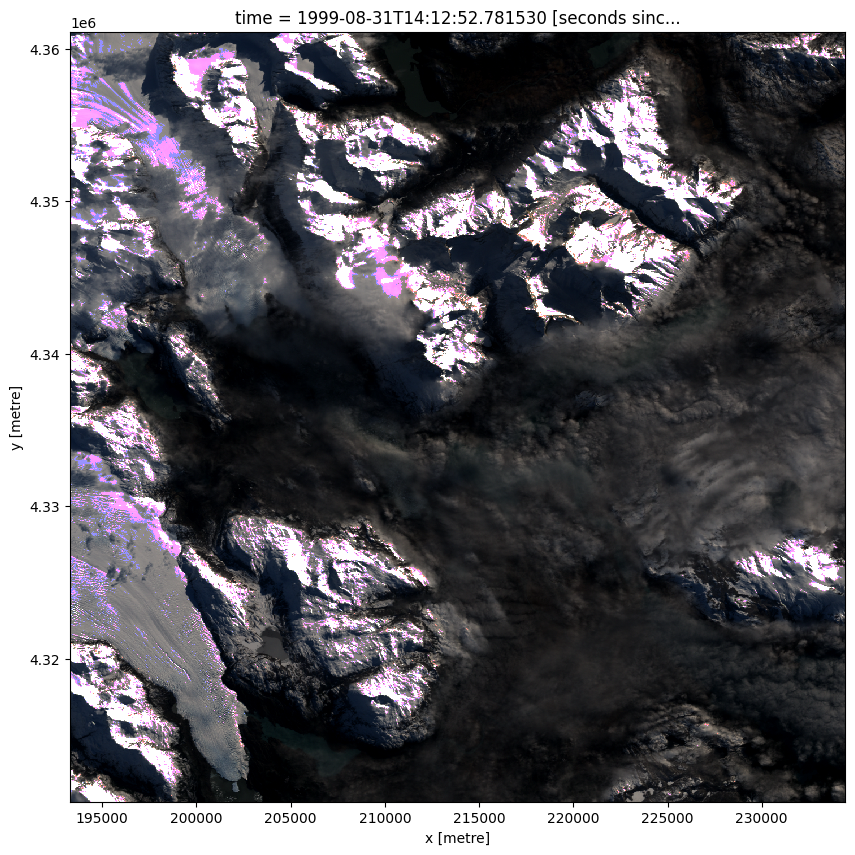

In [28]:
ds[["red", "green", "blue"]].isel(time=2).to_array().plot.imshow(robust=True, figsize=(10, 10))


### Landsat 8

In [63]:
ds8 = dc.load(**query8)


In [64]:
ds8

<xarray.Dataset>
Dimensions:      (time: 369, y: 1684, x: 1371)
Coordinates:
  * time         (time) datetime64[ns] 2013-03-30T14:18:47.272840 ... 2024-03...
  * y            (y) float64 4.361e+06 4.361e+06 ... 4.311e+06 4.311e+06
  * x            (x) float64 1.933e+05 1.933e+05 ... 2.344e+05 2.344e+05
    spatial_ref  int32 32719
Data variables:
    coastal      (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    blue         (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    green        (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    red          (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    nir08        (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    swir16       (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    swir22       (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    qa_pixel     (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    qa_aerosol   (time, y, x) uint8 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    qa_radsat    (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
Attributes:
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

In [65]:
ds8

<xarray.Dataset>
Dimensions:      (time: 369, y: 1684, x: 1371)
Coordinates:
  * time         (time) datetime64[ns] 2013-03-30T14:18:47.272840 ... 2024-03...
  * y            (y) float64 4.361e+06 4.361e+06 ... 4.311e+06 4.311e+06
  * x            (x) float64 1.933e+05 1.933e+05 ... 2.344e+05 2.344e+05
    spatial_ref  int32 32719
Data variables:
    coastal      (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    blue         (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    green        (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    red          (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    nir08        (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    swir16       (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    swir22       (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    qa_pixel     (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    qa_aerosol   (time, y, x) uint8 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    qa_radsat    (time, y, x) uint16 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
Attributes:
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

In [66]:
good_pixel_flags = {
    "cloud": "not_high_confidence",
    "cloud_shadow": "not_high_confidence",
    "nodata": False
}

In [67]:
bandas_reflectancia = ["coastal", "blue", "green", "red", "nir08", "swir16", "swir22"]


In [68]:
quality_band = 'qa_pixel'
cloud_free_mask1 = masking.make_mask(ds8[quality_band], **good_pixel_flags)
dsf = ds8[bandas_reflectancia].where(cloud_free_mask1)


In [69]:
dsf

<xarray.Dataset>
Dimensions:      (time: 369, y: 1684, x: 1371)
Coordinates:
  * time         (time) datetime64[ns] 2013-03-30T14:18:47.272840 ... 2024-03...
  * y            (y) float64 4.361e+06 4.361e+06 ... 4.311e+06 4.311e+06
  * x            (x) float64 1.933e+05 1.933e+05 ... 2.344e+05 2.344e+05
    spatial_ref  int32 32719
Data variables:
    coastal      (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    blue         (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    green        (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    red          (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    nir08        (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    swir16       (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
    swir22       (time, y, x) float32 dask.array<chunksize=(1, 1684, 1371), meta=np.ndarray>
Attributes:
    crs:           EPSG:32719
    grid_mapping:  spatial_ref

/env/lib/python3.10/site-packages/matplotlib/cm.py:489: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


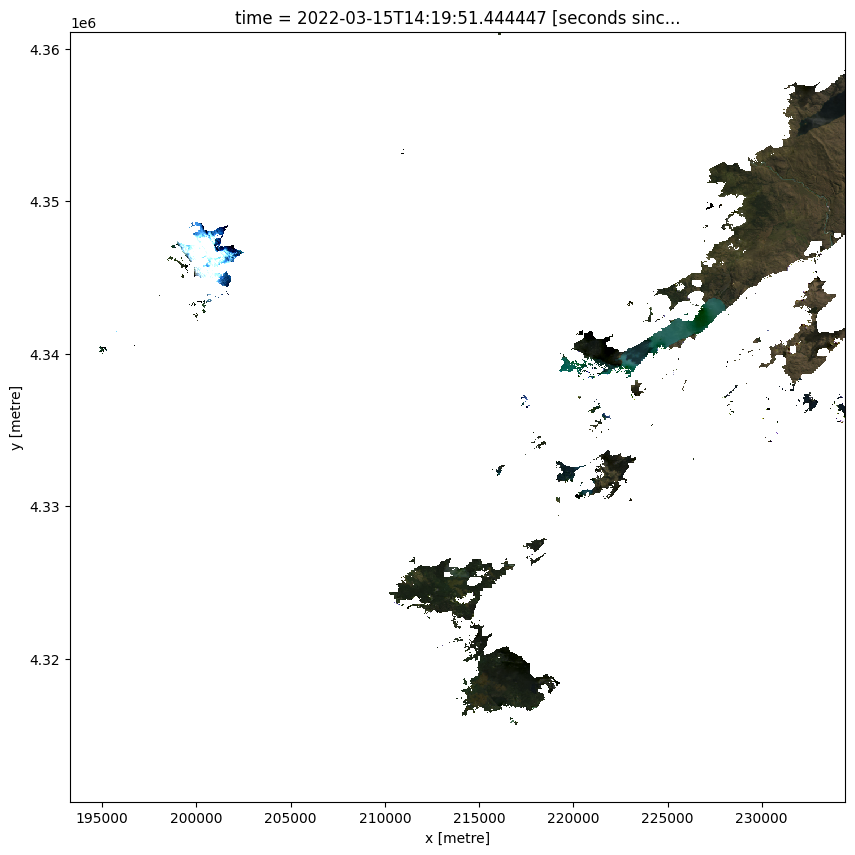

In [70]:
dsf[["red", "green", "blue"]].isel(time=300).to_array().plot.imshow(robust=True, figsize=(10, 10))


In [71]:
valid_pixel_proportion = cloud_free_mask1.sum(dim=("x", "y"))/(cloud_free_mask1.shape[1] * cloud_free_mask1.shape[2])

valid_threshold = 0.8

observations_to_keep = (valid_pixel_proportion >= valid_threshold)

In [72]:
ds_keep = dsf.sel(time=observations_to_keep).persist()


In [73]:
ds_keep[["red", "green", "blue"]].isel(time=0).time # obtener tiempo ATENCION: aqui habria que ir sacando los time para hacer el filtro

<xarray.DataArray 'time' ()>
array('2015-01-23T14:19:52.192663000', dtype='datetime64[ns]')
Coordinates:
    time         datetime64[ns] 2015-01-23T14:19:52.192663
    spatial_ref  int32 32719
Attributes:
    units:    seconds since 1970-01-01 00:00:00

In [83]:
SELECTED_TIME = np.datetime_as_string(ds_keep[["red", "green", "blue"]].isel(time=0).time.values)
print(SELECTED_TIME)

2015-01-23T14:19:52.192663000


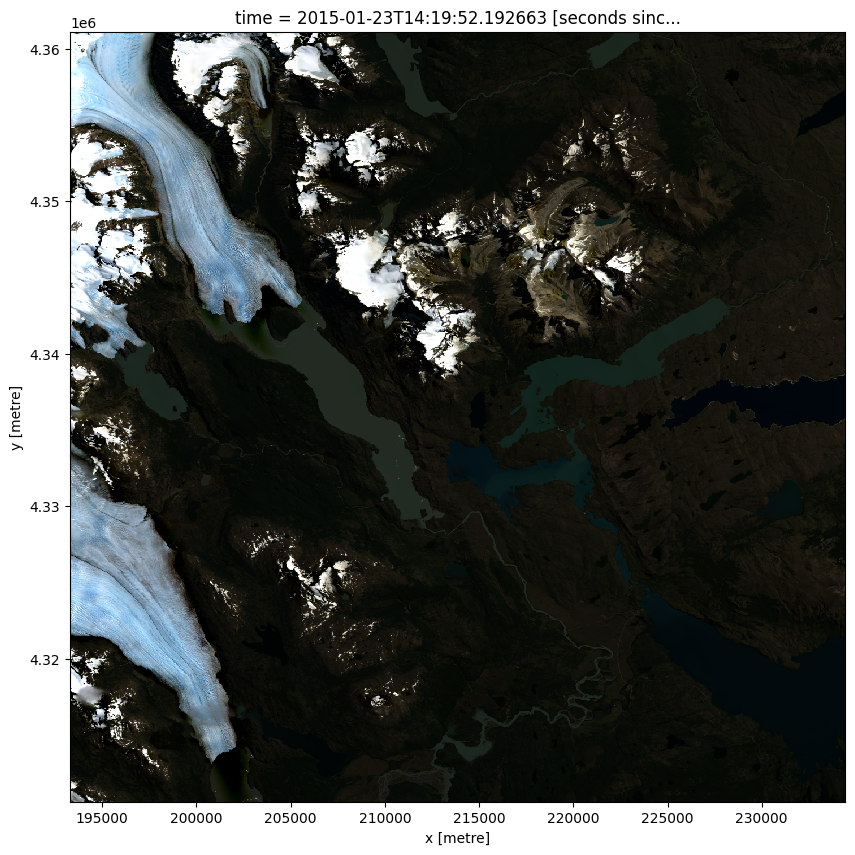

In [84]:
# imagen rgb de sector encontrado con bajo % de nube
ds8[["red", "green", "blue"]].sel(time=SELECTED_TIME).to_array().plot.imshow(robust=True, figsize=(10, 10))

/env/lib/python3.10/site-packages/matplotlib/cm.py:489: RuntimeWarning: invalid value encountered in cast
  xx = (xx * 255).astype(np.uint8)


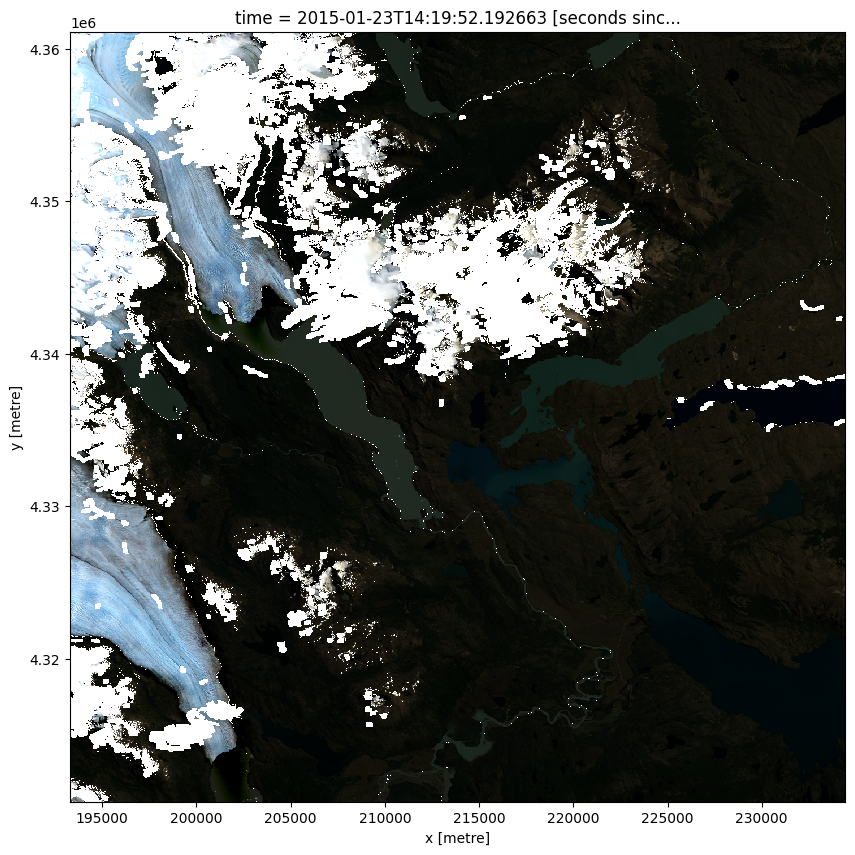

In [86]:
# con la mascara
ds_keep[["red", "green", "blue"]].sel(time=SELECTED_TIME).to_array().plot.imshow(robust=True, figsize=(10, 10))

/env/lib/python3.10/site-packages/rasterio/warp.py:344: NotGeoreferencedWarning: Dataset has no geotransform, gcps, or rpcs. The identity matrix will be returned.
  _reproject(


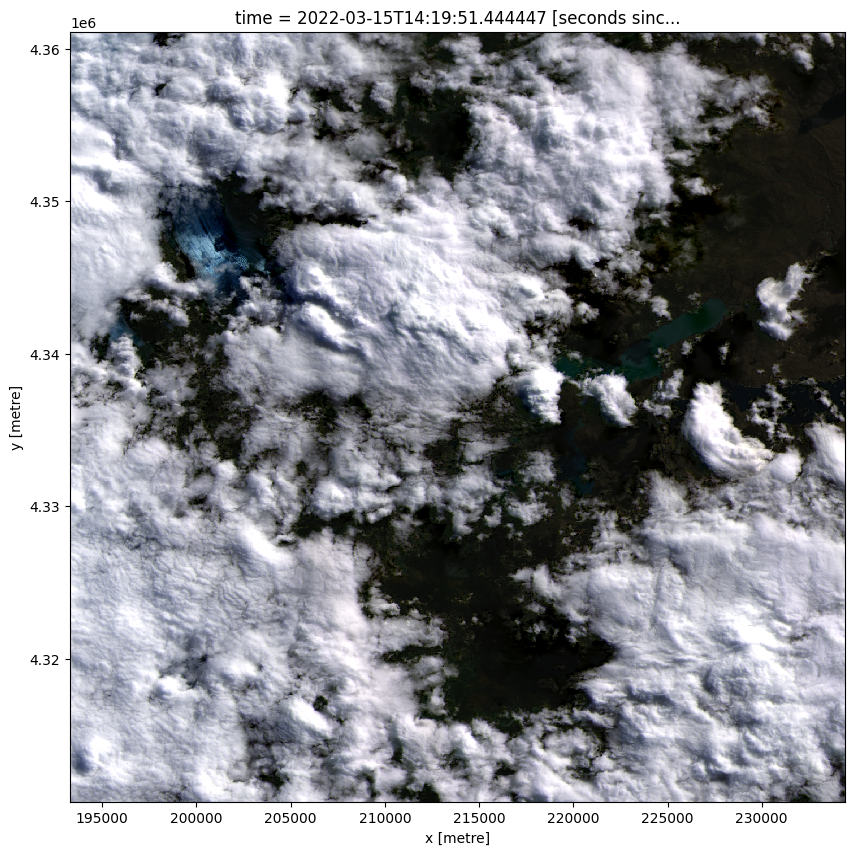

In [76]:
# sector encontrado con alta nube
ds8[["red", "green", "blue"]].isel(time=300).to_array().plot.imshow(robust=True, figsize=(10, 10))


In [87]:
client.close()

cluster.close()